# Segmentation map으로 도로 이미지 만들기

## 데이터 준비

In [1]:
import os

data_path = os.getenv("HOME") + "/aiffel/conditional_generation/data/cityscapes/train/"
len(os.listdir(data_path))

1000

1,000장의 훈련용 이미지가 존재합니다.

### 데이터 확인

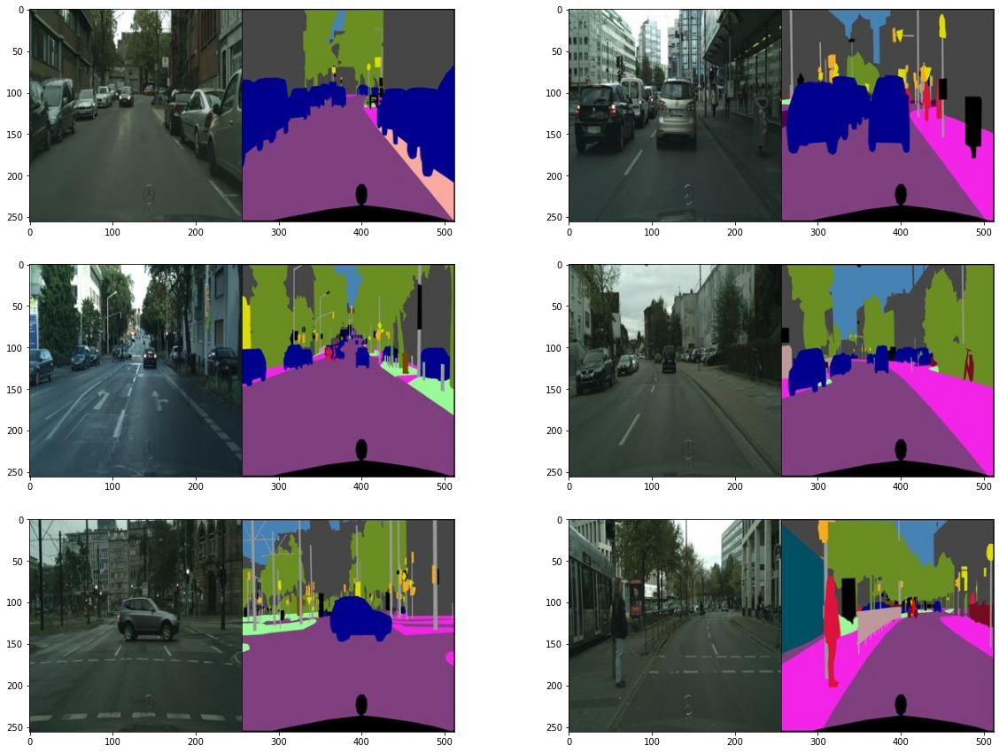

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 15))
for i in range(1, 7):
    f = data_path + os.listdir(data_path)[np.random.randint(800)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(3, 2, i)
    plt.imshow(img)

입력으로 사용해야 하는 데이터가 오른쪽, 출력으로 사용해야 하는 데이터가 왼쪽에 존재합니다.  
이미지의 왼쪽과 오른쪽을 분리하는 함수를 정의합니다.

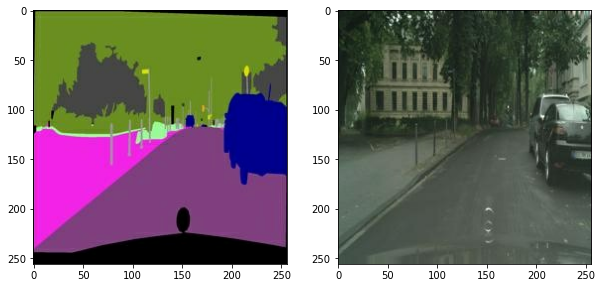

In [3]:
import tensorflow as tf


def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x / 127.5) - 1


def denormalize(x):
    x = (x + 1) * 127.5
    x = x.numpy()
    return x.astype(np.uint8)


def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)

    w = tf.shape(img)[1] // 2
    segmap = img[:, w:, :]
    segmap = tf.cast(segmap, tf.float32)
    photo = img[:, :w, :]
    photo = tf.cast(photo, tf.float32)
    return normalize(segmap), normalize(photo)


f = data_path + os.listdir(data_path)[1]
segmap, photo = load_img(f)

plt.figure(figsize=(10, 7))
plt.subplot(1, 2, 1)
plt.imshow(denormalize(segmap))
plt.subplot(1, 2, 2)
plt.imshow(denormalize(photo))

### 데이터 증강

훈련용 데이터가 1,000이 존재하여 다양한 데이터 입력 효과를 위하여 데이터 증강을 적용합니다.
1. 0.5의 확률로 reflection padding 또는 constant padding을 적용합니다.
    - padding이 적용되는 크기는 이미지 크기의 약 10%인 25를 기준으로 합니다.
    - 빈 공간에 상수값을 채우는 constant 방법에는 0(0~255 기준)을 사용합니다.
2. padding을 적용한 1번의 결과에서 확률적으로 (256, 256) 크기만큼 crop합니다.
3. 2의 결과에 임의의 확률에 따라 좌우반전을 적용합니다.
4. 3의 결과에 임의의 확률에 따라 상하반전을 적용합니다.
5. 4의 결과에 임의의 확률에 따라 회전을 적용합니다.

In [4]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation


@tf.function()  # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다.
def apply_augmentation(segmap, photo):
    stacked = tf.concat([segmap, photo], axis=-1)

    _pad = tf.constant([[25, 25], [25, 25], [0, 0]])
    if tf.random.uniform(()) < 0.5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=-1.0)

    out = image.random_crop(padded, size=[256, 256, 6])
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)

    if tf.random.uniform(()) < 0.5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)

    return out[..., :3], out[..., 3:]

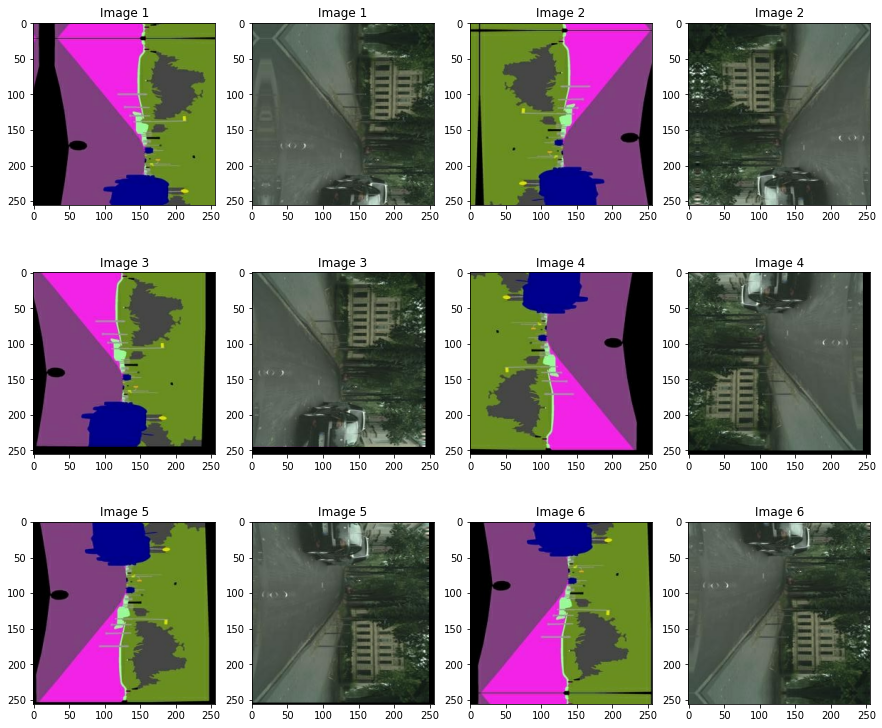

In [5]:
plt.figure(figsize=(15, 13))
img_n = 1
for i in range(1, 13, 2):
    augmented_segmap, augmented_photo = apply_augmentation(segmap, photo)

    plt.subplot(3, 4, i)
    plt.imshow(denormalize(augmented_segmap))
    plt.title(f"Image {img_n}")
    plt.subplot(3, 4, i + 1)
    plt.imshow(denormalize(augmented_photo))
    plt.title(f"Image {img_n}")
    img_n += 1

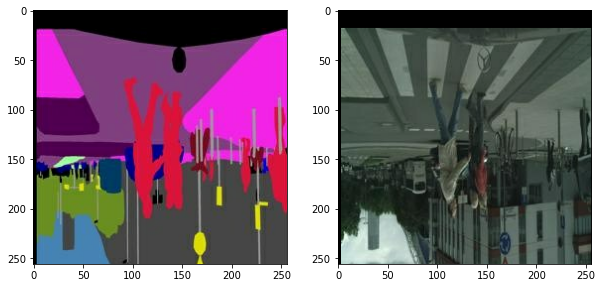

In [6]:
from tensorflow import data


def get_train(img_path):
    segmap, photo = load_img(img_path)
    segmap, photo = apply_augmentation(segmap, photo)
    return segmap, photo


train_images = data.Dataset.list_files(data_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
segmap, photo = (sample[0][0] + 1) * 127.5, (sample[0][1] + 1) * 127.5

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(segmap[0].astype(np.uint8))
plt.subplot(1, 2, 2)
plt.imshow(photo[0].astype(np.uint8))

## 모델 정의

### Generator 정의

Encode 블록과 Decode 블록을 사용하여 Generator 모델을 정의합니다.

In [7]:
from tensorflow.keras import layers, Input, Model


class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

In [8]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()

    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(0.5)(x)
        return self.relu(x)

In [9]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64, 128, 256, 512, 512, 512, 512, 512]
        decode_filters = [512, 512, 512, 512, 256, 128, 64]

        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))

        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))

        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)

    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)

        features = features[:-1]

        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])

        x = self.last_conv(x)
        return x

    def get_summary(self, input_shape=(256, 256, 3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

In [10]:
UNetGenerator().get_summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block (EncodeBlock)      (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
encode_block_1 (EncodeBlock)    (None, 64, 64, 128)  131584      encode_block[0][0]               
__________________________________________________________________________________________________
encode_block_2 (EncodeBlock)    (None, 32, 32, 256)  525312      encode_block_1[0][0]             
______________________________________________________________________________________________

### Discriminator 정의

Discriminator 블록을 만들고, 이를 이용하여 Discriminator 모델을 정의합니다.

In [11]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act

        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)

        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None

    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)

        if self.use_bn:
            x = self.batchnorm(x)

        if self.act:
            x = self.lrelu(x)
        return x

In [12]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(
            n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True
        )
        self.block3 = DiscBlock(
            n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True
        )
        self.block4 = DiscBlock(
            n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True
        )
        self.block5 = DiscBlock(
            n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True
        )
        self.block6 = DiscBlock(
            n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False
        )
        self.sigmoid = layers.Activation("sigmoid")

    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)

    def get_summary(self, x_shape=(256, 256, 3), y_shape=(256, 256, 3)):
        x, y = Input(x_shape), Input(y_shape)
        return Model((x, y), self.call(x, y)).summary()

In [13]:
Discriminator().get_summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_2[0][0]                    
                                                                 input_3[0][0]                    
__________________________________________________________________________________________________
disc_block (DiscBlock)          (None, 128, 128, 64) 6144        concatenate_7[0][0]        

## 모델 훈련

### 손실 함수 정의

일반적인 GAN에서 사용되는 생성 모델을 위한 손실 함수에 L1 loss를 추가한 손실 함수를 정의합니다.  
판별 모델에는 추가적인 항목을 사용하지 않고 Cross entropy만을 사용합니다.

In [14]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()


def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss


def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(
        tf.ones_like(real_disc), real_disc
    )

### 모델 학습

최적화 함수는 Adam을 사용합니다.

In [15]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=0.5, beta_2=0.999)
disc_opt = optimizers.Adam(2e-4, beta_1=0.5, beta_2=0.999)

In [16]:
@tf.function
def train_step(segmap, real_photo):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_photo = generator(segmap, training=True)
        # Discriminator 예측
        fake_disc = discriminator(segmap, fake_photo, training=True)
        real_disc = discriminator(segmap, real_photo, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_photo, real_photo, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss)  ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)

    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

In [17]:
EPOCHS = 10

generator = UNetGenerator()
discriminator = Discriminator()

print_interval = len(train_images) // 2

for epoch in range(1, EPOCHS + 1):
    for i, (segmap, photo) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(segmap, photo)
        if (i + 1) % print_interval == 0:
            print(
                f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}",
                end="\n\n",
            )

EPOCH[1] - STEP[125]                     
Generator_loss:1.6609                     
L1_loss:0.1624                     
Discriminator_loss:0.9686

EPOCH[1] - STEP[250]                     
Generator_loss:2.5832                     
L1_loss:0.1754                     
Discriminator_loss:0.4898

EPOCH[2] - STEP[125]                     
Generator_loss:0.8691                     
L1_loss:0.1857                     
Discriminator_loss:0.8598

EPOCH[2] - STEP[250]                     
Generator_loss:1.7610                     
L1_loss:0.1585                     
Discriminator_loss:0.6031

EPOCH[3] - STEP[125]                     
Generator_loss:2.3242                     
L1_loss:0.2100                     
Discriminator_loss:0.3434

EPOCH[3] - STEP[250]                     
Generator_loss:0.4594                     
L1_loss:0.1750                     
Discriminator_loss:2.1429

EPOCH[4] - STEP[125]                     
Generator_loss:1.3533                     
L1_loss:0.2199             

## 모델 테스트

학습된 모델을 테스트합니다. 훈련용 데이터에 포함되어 있지 않았던 검증용 데이터를 입력합니다.

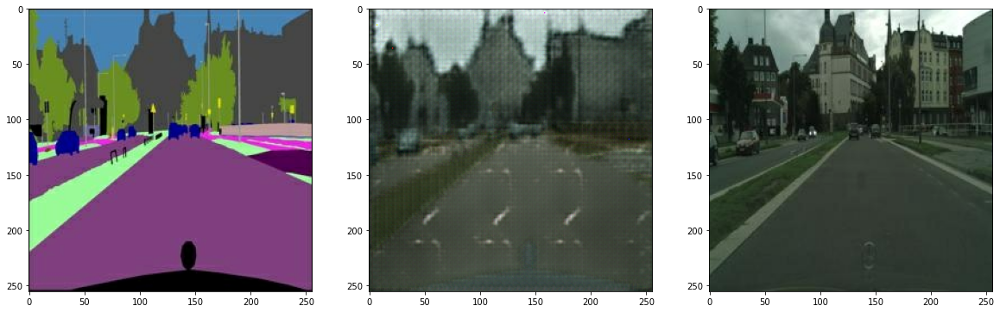

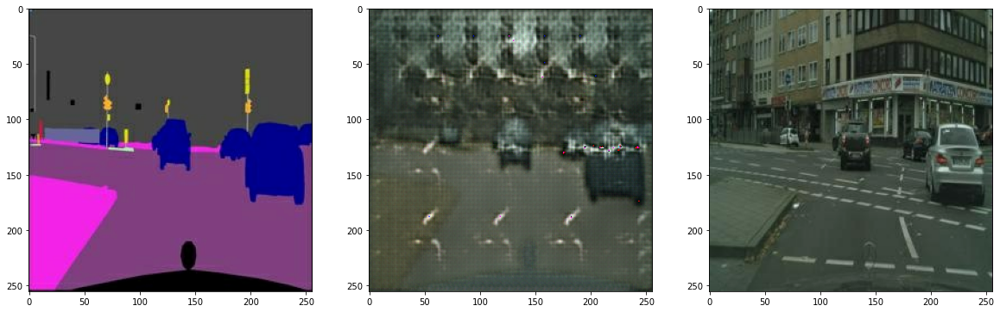

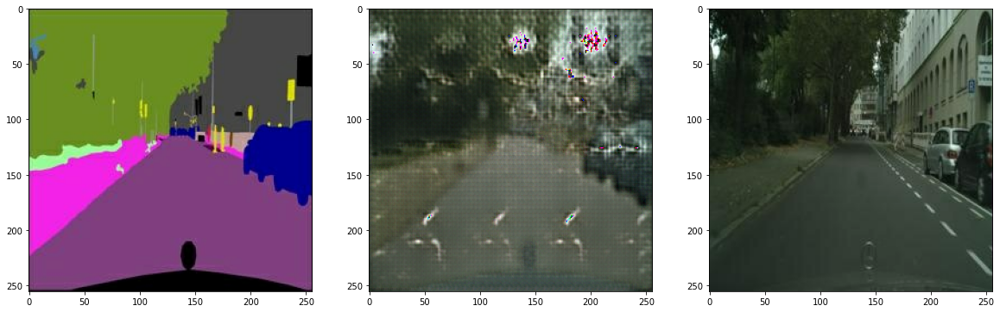

In [18]:
test_path = os.getenv("HOME") + "/aiffel/conditional_generation/data/cityscapes/val/"

for test_ind in range(3):
    f = data_path + os.listdir(test_path)[test_ind]
    segmap, photo = load_img(f)

    pred = generator(tf.expand_dims(segmap, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20, 10))
    plt.subplot(1, 3, 1)
    plt.imshow(denormalize(segmap))
    plt.subplot(1, 3, 2)
    plt.imshow(pred[0])
    plt.subplot(1, 3, 3)
    plt.imshow(denormalize(photo))

10 epoch 이후의 실험 결과입니다. 도로와 차의 구별이 가능한 정도로 이미지가 생성되었지만, 불필요한 패턴이 보이거나 좋지 못한 품질의 이미지가 생성되었습니다.  
추가 epoch에 대한 훈련을 진행하면서 이미지의 품질이 어떻게 달라지는 지 확인합니다.

In [19]:
for epoch in range(1 + 10, 20 + 1):
    for i, (segmap, photo) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(segmap, photo)

    print(
        f"EPOCH[{epoch}] \
            \nGenerator_loss:{g_loss.numpy():.4f} \
            \nL1_loss:{l1_loss.numpy():.4f} \
            \nDiscriminator_loss:{d_loss.numpy():.4f}",
        end="\n\n",
    )

EPOCH[11]             
Generator_loss:1.1645             
L1_loss:0.2237             
Discriminator_loss:0.4577

EPOCH[12]             
Generator_loss:0.7860             
L1_loss:0.2011             
Discriminator_loss:0.7772

EPOCH[13]             
Generator_loss:0.5800             
L1_loss:0.2103             
Discriminator_loss:0.9500

EPOCH[14]             
Generator_loss:1.7118             
L1_loss:0.1868             
Discriminator_loss:0.4793

EPOCH[15]             
Generator_loss:0.9531             
L1_loss:0.2188             
Discriminator_loss:0.5810

EPOCH[16]             
Generator_loss:1.5283             
L1_loss:0.1822             
Discriminator_loss:0.5083

EPOCH[17]             
Generator_loss:0.7571             
L1_loss:0.1776             
Discriminator_loss:1.1606

EPOCH[18]             
Generator_loss:1.4225             
L1_loss:0.1538             
Discriminator_loss:0.8820

EPOCH[19]             
Generator_loss:1.1141             
L1_loss:0.1636             
Discrimina

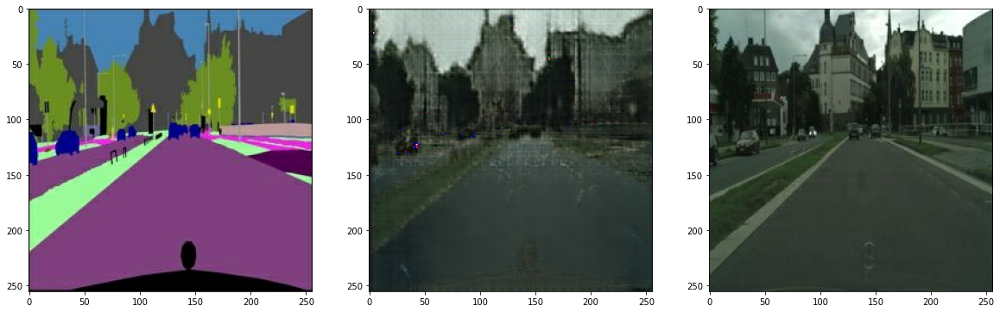

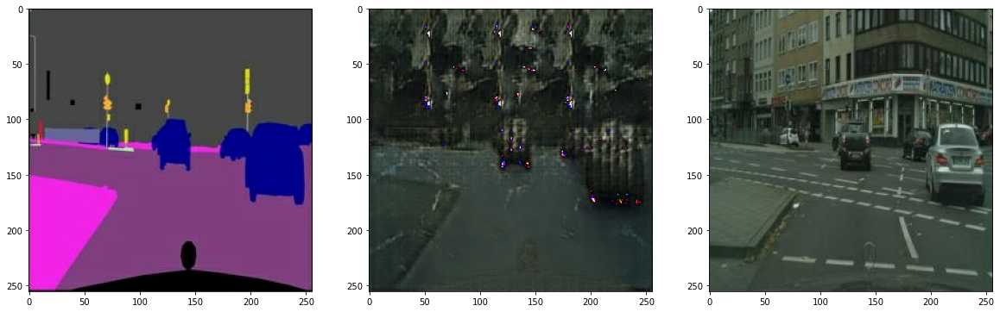

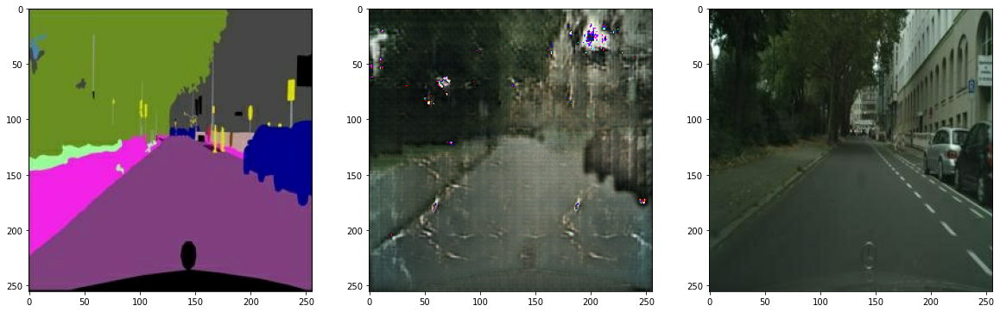

In [20]:
for test_ind in range(3):
    f = data_path + os.listdir(test_path)[test_ind]
    segmap, photo = load_img(f)

    pred = generator(tf.expand_dims(segmap, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20, 10))
    plt.subplot(1, 3, 1)
    plt.imshow(denormalize(segmap))
    plt.subplot(1, 3, 2)
    plt.imshow(pred[0])
    plt.subplot(1, 3, 3)
    plt.imshow(denormalize(photo))

In [21]:
for epoch in range(1 + 20, 50 + 1):
    for i, (segmap, photo) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(segmap, photo)

    if (epoch + 1) % 5 == 0:
        print(
            f"EPOCH[{epoch}] \
                \nGenerator_loss:{g_loss.numpy():.4f} \
                \nL1_loss:{l1_loss.numpy():.4f} \
                \nDiscriminator_loss:{d_loss.numpy():.4f}",
            end="\n\n",
        )

EPOCH[24]                 
Generator_loss:1.6134                 
L1_loss:0.1560                 
Discriminator_loss:0.4699

EPOCH[29]                 
Generator_loss:2.2488                 
L1_loss:0.2352                 
Discriminator_loss:0.1604

EPOCH[34]                 
Generator_loss:1.6029                 
L1_loss:0.2306                 
Discriminator_loss:0.4597

EPOCH[39]                 
Generator_loss:0.9376                 
L1_loss:0.1963                 
Discriminator_loss:0.7439

EPOCH[44]                 
Generator_loss:3.3449                 
L1_loss:0.1468                 
Discriminator_loss:1.5258

EPOCH[49]                 
Generator_loss:0.4107                 
L1_loss:0.2149                 
Discriminator_loss:1.3322



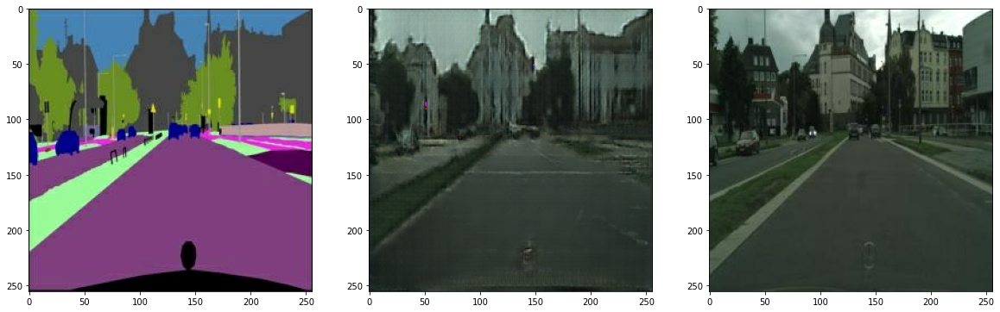

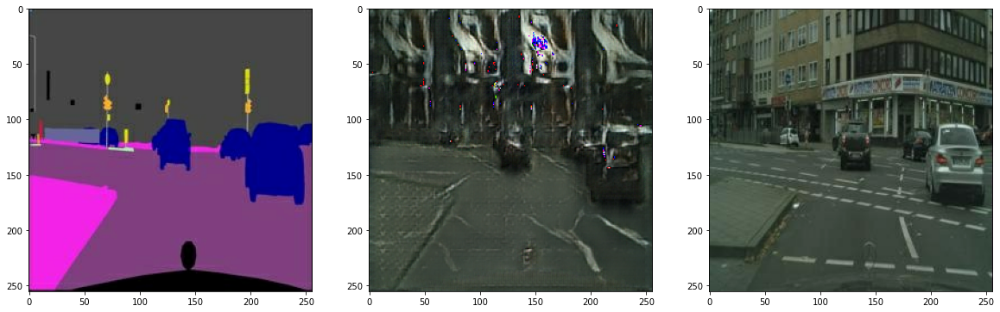

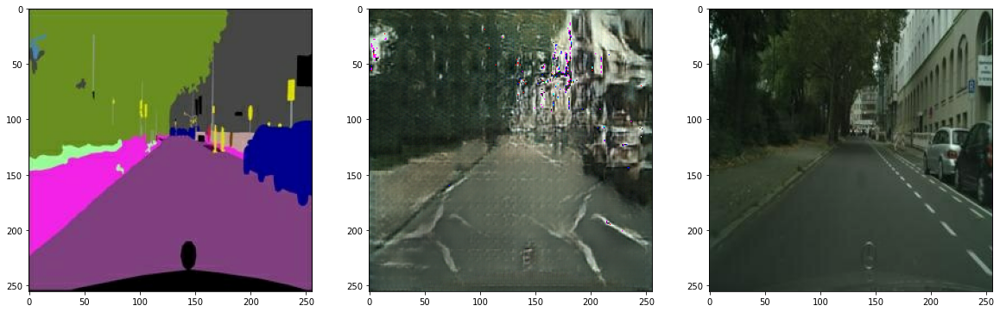

In [22]:
for test_ind in range(3):
    f = data_path + os.listdir(test_path)[test_ind]
    segmap, photo = load_img(f)

    pred = generator(tf.expand_dims(segmap, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20, 10))
    plt.subplot(1, 3, 1)
    plt.imshow(denormalize(segmap))
    plt.subplot(1, 3, 2)
    plt.imshow(pred[0])
    plt.subplot(1, 3, 3)
    plt.imshow(denormalize(photo))

In [23]:
for epoch in range(1 + 50, 100 + 1):
    for i, (segmap, photo) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(segmap, photo)
        
    if (epoch + 1) % 20 == 0:
        print(
            f"EPOCH[{epoch}] \
                \nGenerator_loss:{g_loss.numpy():.4f} \
                \nL1_loss:{l1_loss.numpy():.4f} \
                \nDiscriminator_loss:{d_loss.numpy():.4f}",
            end="\n\n",
        )

EPOCH[59]                 
Generator_loss:1.4498                 
L1_loss:0.1541                 
Discriminator_loss:0.8668

EPOCH[79]                 
Generator_loss:1.9624                 
L1_loss:0.2473                 
Discriminator_loss:0.3586

EPOCH[99]                 
Generator_loss:1.8688                 
L1_loss:0.1460                 
Discriminator_loss:1.5222



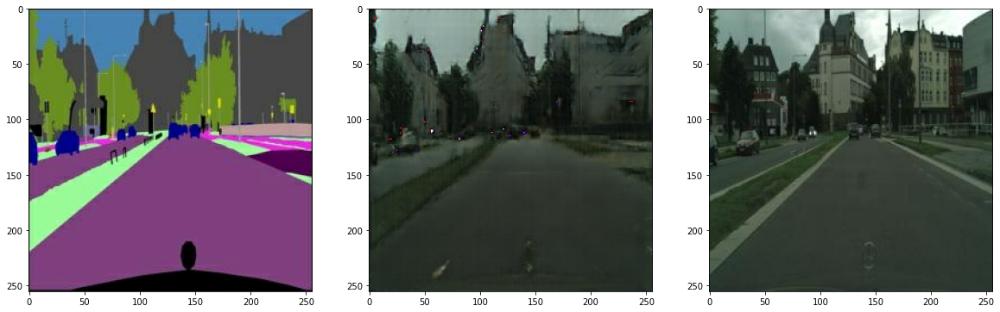

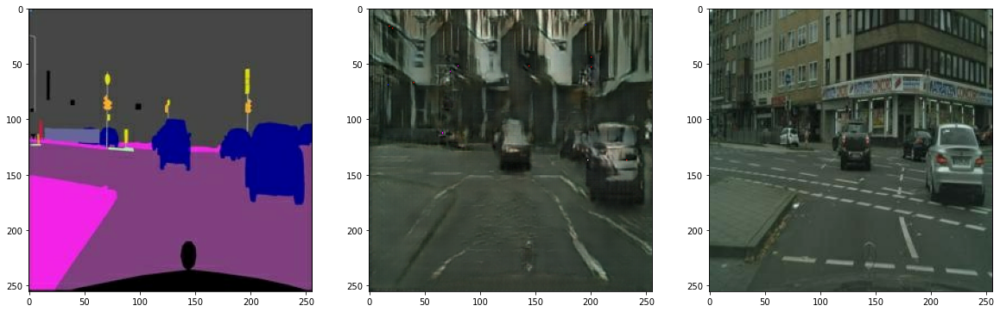

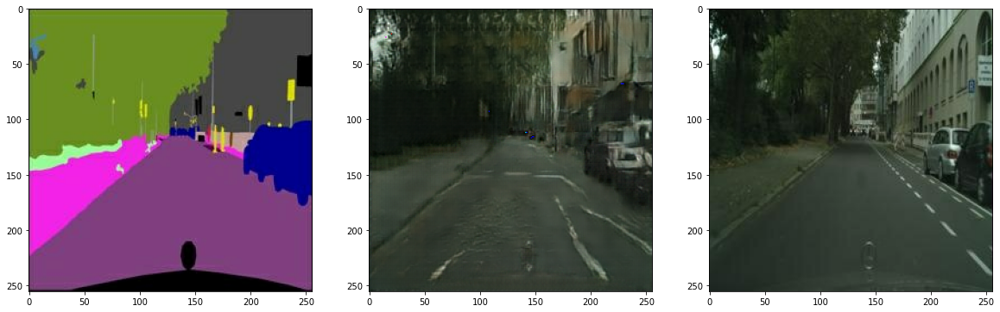

In [24]:
for test_ind in range(3):
    f = data_path + os.listdir(test_path)[test_ind]
    segmap, photo = load_img(f)

    pred = generator(tf.expand_dims(segmap, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20, 10))
    plt.subplot(1, 3, 1)
    plt.imshow(denormalize(segmap))
    plt.subplot(1, 3, 2)
    plt.imshow(pred[0])
    plt.subplot(1, 3, 3)
    plt.imshow(denormalize(photo))

In [25]:
for epoch in range(1 + 100, 300 + 1):
    for i, (segmap, photo) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(segmap, photo)
        
    if (epoch + 1) % 20 == 0:
        print(
            f"EPOCH[{epoch}] \
                \nGenerator_loss:{g_loss.numpy():.4f} \
                \nL1_loss:{l1_loss.numpy():.4f} \
                \nDiscriminator_loss:{d_loss.numpy():.4f}",
            end="\n\n",
        )

EPOCH[119]                 
Generator_loss:1.1506                 
L1_loss:0.1437                 
Discriminator_loss:1.1123

EPOCH[139]                 
Generator_loss:1.7653                 
L1_loss:0.1658                 
Discriminator_loss:0.6931

EPOCH[159]                 
Generator_loss:1.4891                 
L1_loss:0.1502                 
Discriminator_loss:1.8822

EPOCH[179]                 
Generator_loss:1.4588                 
L1_loss:0.1691                 
Discriminator_loss:0.9594

EPOCH[199]                 
Generator_loss:1.6056                 
L1_loss:0.1760                 
Discriminator_loss:0.5369

EPOCH[219]                 
Generator_loss:1.7183                 
L1_loss:0.1548                 
Discriminator_loss:0.7544

EPOCH[239]                 
Generator_loss:1.5911                 
L1_loss:0.1713                 
Discriminator_loss:1.1716

EPOCH[259]                 
Generator_loss:2.2477                 
L1_loss:0.1376                 
Discriminator_loss:

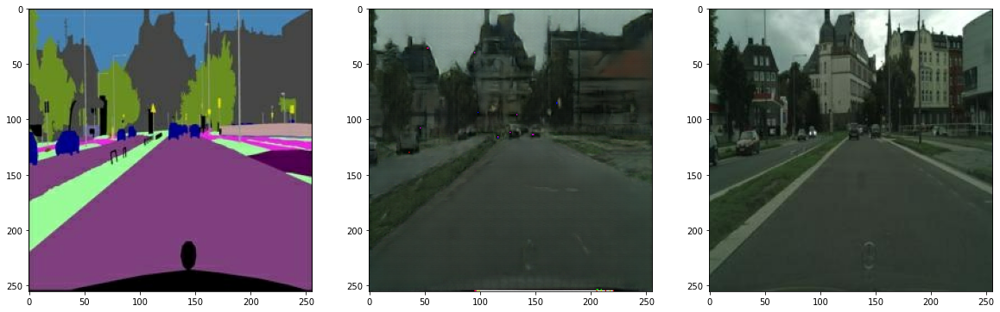

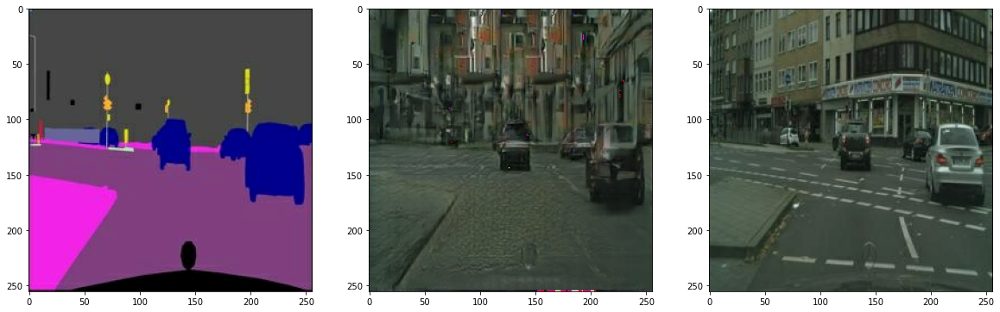

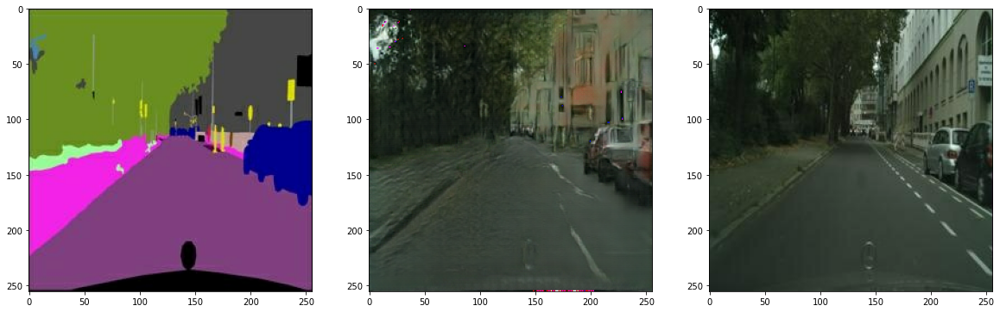

In [26]:
for test_ind in range(3):
    f = data_path + os.listdir(test_path)[test_ind]
    segmap, photo = load_img(f)

    pred = generator(tf.expand_dims(segmap, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20, 10))
    plt.subplot(1, 3, 1)
    plt.imshow(denormalize(segmap))
    plt.subplot(1, 3, 2)
    plt.imshow(pred[0])
    plt.subplot(1, 3, 3)
    plt.imshow(denormalize(photo))

## 실험 결과 및 고찰

| Epoch | Result |
| --- | --- |
| 10 | ![10e](img/e17_res01.png) |
| 20 | ![20e](img/e17_res02.png) |
| 50 | ![50e](img/e17_res03.png) |
| 100 | ![100e](img/e17_res04.png) |
| 300 | ![300e](img/e17_res05.png) |

- 훈련이 진행될수록 의미없는 패턴은 사라지고, 각 클래스에 해당하는 영역의 텍스쳐가 명확해집니다. 또한 각 클래스 영역의 구분도 정교해집니다.
- 특이사항은 데이터셋에 포함되어 있는 이미지의 하단에 항상 차량의 앞부분이 포함되어 있어 예측 결과에서도 차량의 형태를 확인할 수 있다는 점입니다.
- 각 클래스에 대한 영역 정보와 실제 이미지를 이용하여 학습을 진행하면, 각 픽셀에 대한 클래스라는 단순한 정보만을 사용하여 그럴듯한 이미지를 생성할 수 있다는 점에서 GAN의 다양한 응용 가능성을 확인할 수 있는 실험이었습니다.

## 루브릭

| 평가문항                                      | 상세기준                                                                      |
| --- | --- |
| 1. pix2pix 모델 학습을 위해 필요한 데이터셋을 적절히 구축하였다. | 데이터 분석 과정 및 한 가지 이상의 augmentation을 포함한 데이터셋 구축 과정이 체계적으로 제시되었다.           |
| 2. pix2pix 모델을 구현하여 성공적으로 학습 과정을 진행하였다.   | U-Net generator, discriminator 모델 구현이 완료되어 train\_step이 안정적으로 진행됨을 확인하였다. |
| 3. 학습 과정 및 테스트에 대한 시각화 결과를 제출하였다.         | 10 epoch 이상의 학습을 진행한 후 최종 테스트 결과에서 진행한 epoch 수에 걸맞은 정도의 품질을 확인하였다.        |

### 루브릭 자체평가

1. 적절한 데이터 증강 방법을 적용하였다.
2. U-Net 구조를 차용한 생성 모델과 판별 모델을 정의하고 훈련을 진행하였다.
3. 300 epoch 동안 훈련을 진행하며, 출력 이미지의 품질이 점차 향상됨을 확인하였다.